In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
pd.reset_option('^display.', silent=True)

In [115]:
data =  pd.read_csv('adult.data')

In [116]:
testData =  pd.read_csv('adult.test')

In [117]:
data.columns = ['age','work_class','fnlwgt','education','education-num',
              'marital-status','occupation','relationship','race',
              'sex','capital-gain','capital-loss','hours-per-week',
              'native-country','income']

data.columns



Index(['age', 'work_class', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

In [118]:
data = data[data.work_class != ' ?']
data = data[data.occupation != ' ?']

In [119]:
testData.columns = ['age','work_class','fnlwgt','education','education-num',
              'marital-status','occupation','relationship','race',
              'sex','capital-gain','capital-loss','hours-per-week',
              'native-country','income']

testData.columns



Index(['age', 'work_class', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

In [120]:
testData = testData[testData.work_class != ' ?']
testData = testData[testData.occupation != ' ?']

In [121]:
df =  data[['age','work_class','education','occupation'
            ,'relationship','race'
            ,'sex','hours-per-week','income']]
df.columns

Index(['age', 'work_class', 'education', 'occupation', 'relationship', 'race',
       'sex', 'hours-per-week', 'income'],
      dtype='object')

In [122]:
dfTest =  testData[['age','work_class','education','occupation'
            ,'relationship','race'
            ,'sex','hours-per-week','income']]
dfTest.columns


Index(['age', 'work_class', 'education', 'occupation', 'relationship', 'race',
       'sex', 'hours-per-week', 'income'],
      dtype='object')

In [123]:
#work class
df = df.replace([' Private', ' Self-emp-not-inc', ' Self-emp-inc', ' Federal-gov', ' Local-gov', ' State-gov'
                 , ' Without-pay', ' Never-worked'],[1,2,3,4,5,6,7,8])


In [124]:
#work class
dfTest = dfTest.replace([' Private', ' Self-emp-not-inc', ' Self-emp-inc', ' Federal-gov', ' Local-gov', ' State-gov'
                 , ' Without-pay', ' Never-worked'],[1,2,3,4,5,6,7,8])

In [125]:
#relationship
df = df.replace([' Wife', ' Own-child', ' Husband', ' Not-in-family',
                     ' Other-relative', ' Unmarried'],[1,2,3,4,5,6])

In [126]:
#relationship
dfTest = dfTest.replace([' Wife', ' Own-child', ' Husband', ' Not-in-family', ' Other-relative',
                     ' Unmarried'],[1,2,3,4,5,6])

In [127]:
#education
df = df.replace([' Bachelors', ' Some-college', ' 11th', ' HS-grad', ' Prof-school', ' Assoc-acdm',
                 ' Assoc-voc', ' 9th', ' 7th-8th', ' 12th', ' Masters', ' 1st-4th', ' 10th', ' Doctorate', 
                 ' 5th-6th', ' Preschool'],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16])

In [128]:
#education
dfTest = dfTest.replace([' Bachelors', ' Some-college', ' 11th', ' HS-grad', ' Prof-school', ' Assoc-acdm',
                 ' Assoc-voc', ' 9th', ' 7th-8th', ' 12th', ' Masters', ' 1st-4th', ' 10th', ' Doctorate', 
                 ' 5th-6th', ' Preschool'],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16])

In [129]:
#occupation’
df = df.replace([' Tech-support', ' Craft-repair', ' Other-service', ' Sales', ' Exec-managerial', ' Prof-specialty', 
                 ' Handlers-cleaners', ' Machine-op-inspct', ' Adm-clerical', ' Farming-fishing', ' Transport-moving',
                 ' Priv-house-serv', ' Protective-serv', ' Armed-Forces'],[1,2,3,4,5,6,7,8,9,10,11,12,13,14])


In [130]:
# occupation’
dfTest = dfTest.replace([' Tech-support', ' Craft-repair', ' Other-service', ' Sales', ' Exec-managerial', ' Prof-specialty', 
                 ' Handlers-cleaners', ' Machine-op-inspct', ' Adm-clerical', ' Farming-fishing', ' Transport-moving',
                 ' Priv-house-serv', ' Protective-serv', ' Armed-Forces'],[1,2,3,4,5,6,7,8,9,10,11,12,13,14])


In [131]:
#race
df = df.replace([' White', ' Asian-Pac-Islander', ' Amer-Indian-Eskimo', ' Other', ' Black']
                ,[1,2,3,4,5])

In [132]:
#race
dfTest = dfTest.replace([' White', ' Asian-Pac-Islander', ' Amer-Indian-Eskimo', ' Other', ' Black']
                ,[1,2,3,4,5])

In [133]:
df = df.replace([' Female', ' Male']
                ,[1,2])

In [134]:
dfTest = dfTest.replace([' Female', ' Male']
                ,[1,2])

In [135]:
df = df.replace([' >50K', ' <=50K']
                ,[0,1])

In [136]:
dfTest = dfTest.replace([' >50K.', ' <=50K.']
                ,[0,1])


In [137]:
df

,age,work_class,education,occupation,relationship,race,sex,hours-per-week,income
0,50,2,1,5,3,1,2,13,1
1,38,1,4,7,4,1,2,40,1
2,53,1,3,7,3,5,2,40,1
3,28,1,1,6,1,5,1,40,1
4,37,1,11,5,1,1,1,40,1
...,...,...,...,...,...,...,...,...,...
32555,27,1,6,1,1,1,1,38,1
32556,40,1,4,8,3,1,2,40,0
32557,58,1,4,9,6,1,1,40,1
32558,22,1,4,9,2,1,2,20,1


In [138]:
dfTest

,age,work_class,education,occupation,relationship,race,sex,hours-per-week,income
0,38,1,4,10,3,1,2,50,1
1,28,5,6,13,3,1,2,40,0
2,44,1,2,8,3,5,2,40,0
4,34,1,13,3,4,1,2,30,1
6,63,2,5,6,3,1,2,32,0
...,...,...,...,...,...,...,...,...,...
16274,33,1,1,6,2,1,2,40,1
16275,39,1,1,6,4,1,1,36,1
16277,38,1,1,6,3,1,2,50,1
16278,44,1,1,9,2,2,2,40,1


In [139]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import time


In [140]:
X_train = df.iloc[:,0:8]
y_train = df['income']

In [141]:
dt = DecisionTreeClassifier(random_state=42)
t0 = time.time()
result = dt.fit(X_train,y_train)
t1 = time.time()
total = t1-t0
total

0.08652710914611816

In [142]:
X_test = dfTest.iloc[:,0:8]
y_test = dfTest['income']

In [143]:
t0 = time.time()
y_pred = dt.predict(X_test)
t1 = time.time()
total = t1-t0
total


0.019287109375

In [144]:
print(y_pred)

[1 1 1 ... 0 1 0]


In [149]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred))

0.7728222541465326


In [150]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

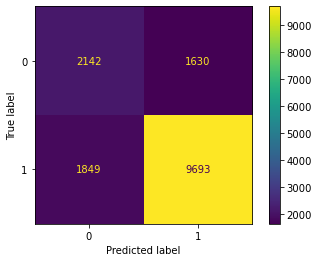

In [151]:
cm = confusion_matrix(y_test, y_pred)

cm_display = ConfusionMatrixDisplay(cm).plot()

In [108]:
from sklearn import tree
import graphviz
from graphviz import Source

[Text(183.42708946999113, 214.42, 'X[4] <= 3.5\ngini = 0.374\nsamples = 30717\nvalue = [7650, 23067]'),
 Text(78.51331826109141, 208.38, 'X[0] <= 29.5\ngini = 0.456\nsamples = 18664\nvalue = [6560, 12104]'),
 Text(10.024411071289814, 202.34, 'X[4] <= 2.5\ngini = 0.138\nsamples = 5267\nvalue = [394, 4873]'),
 Text(4.973972533829669, 196.3, 'X[4] <= 1.5\ngini = 0.054\nsamples = 3846\nvalue = [107, 3739]'),
 Text(1.8733918932948594, 190.26, 'X[2] <= 1.5\ngini = 0.437\nsamples = 270\nvalue = [87, 183]'),
 Text(0.6344974328731379, 184.22, 'X[0] <= 25.5\ngini = 0.463\nsamples = 55\nvalue = [35, 20]'),
 Text(0.30578189536054834, 178.18, 'X[7] <= 31.0\ngini = 0.375\nsamples = 16\nvalue = [4, 12]'),
 Text(0.24462551628843868, 172.14, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.36693827443265803, 172.14, 'X[7] <= 42.5\ngini = 0.32\nsamples = 15\nvalue = [3, 12]'),
 Text(0.24462551628843868, 166.1, 'X[3] <= 5.5\ngini = 0.26\nsamples = 13\nvalue = [2, 11]'),
 Text(0.18346913721632901, 160.

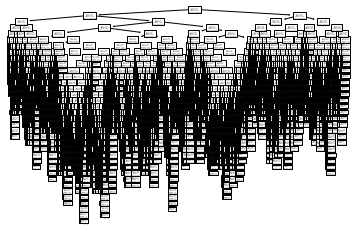

In [152]:
tree.plot_tree(result)

In [153]:
Source(tree.export_graphviz(dt,out_file=None,class_names=True,feature_names=X_train.columns))